In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Mvt9FCxE4mY6vBy5OG08")
project = rf.workspace("urban-lake-wastef").project("extened_dataset-of-waste-classification")
version = project.version(3)
dataset = version.download("coco-segmentation")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.8/195.8 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 29.8 MB/s eta 0:00:0000:01:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 66.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 102.5 MB/s eta 0:00:0000:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-adk 1.25.1 requires google-cloud-bigquer


Extracting Dataset Version Zip to Extened_Dataset-of-Waste-Classification-3 in coco-segmentation:: 100%|██████████| 1955/1955 [00:00<00:00, 5881.93it/s]


In [3]:
import json
import os
import pprint

# Resolve dataset root more robustly (works on Kaggle/Colab and if Roboflow download path differs)
if "dataset" in globals() and getattr(dataset, "location", None):
    DATASET_ROOT = dataset.location
else:
    DATASET_ROOT = "/kaggle/working/Another_approach_try-4"
print("Using DATASET_ROOT =", DATASET_ROOT)

# Paths to the annotation files
train_path = os.path.join(DATASET_ROOT, "train", "_annotations.coco.json")
valid_path = os.path.join(DATASET_ROOT, "valid", "_annotations.coco.json")
test_path = os.path.join(DATASET_ROOT, "test", "_annotations.coco.json")

# Load and inspect a sample annotation file to understand its structure
with open(train_path, 'r') as f:
    train_data = json.load(f)

print("Keys in the annotation file:", list(train_data.keys()))
print("\nCategories:")
for cat in train_data['categories']:
    print(f"ID: {cat['id']}, Name: {cat['name']}")

# Check if the dataset has segmentation annotations
has_segmentations = False
for ann in train_data['annotations'][:5]:
    if 'segmentation' in ann and len(ann['segmentation']) > 0:
        has_segmentations = True
        break

if has_segmentations:
    print("\nDataset contains segmentation annotations.")
    print("Sample segmentation annotation:")
    sample_ann = next(ann for ann in train_data['annotations'] if 'segmentation' in ann and len(ann['segmentation']) > 0)
    print(f"  Image ID: {sample_ann['image_id']}")
    print(f"  Category ID: {sample_ann['category_id']}")
    print(f"  Segmentation format: {type(sample_ann['segmentation']).__name__}")
    print(f"  Number of polygons: {len(sample_ann['segmentation'])}")
    if len(sample_ann['segmentation']) > 0:
        print(f"  Points in first polygon: {len(sample_ann['segmentation'][0])//2}")
else:
    print("\nWARNING: Dataset does not contain segmentation annotations!")
    print("This notebook is intended for segmentation data. Sample annotation format:")
    pprint.pprint(train_data['annotations'][0])

Using DATASET_ROOT = /kaggle/working/Extened_Dataset-of-Waste-Classification-3
Keys in the annotation file: ['info', 'licenses', 'categories', 'images', 'annotations']

Categories:
ID: 0, Name: Organic-Paper-Rubber-yUNM-9Y5P-Teq0
ID: 1, Name: Composite_Rubber_Textile
ID: 2, Name: Organic
ID: 3, Name: Paper
ID: 4, Name: Plastic

Dataset contains segmentation annotations.
Sample segmentation annotation:
  Image ID: 0
  Category ID: 1
  Segmentation format: list
  Number of polygons: 1
  Points in first polygon: 18


In [4]:

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

plt.rcParams.update({
    "figure.dpi":         150,
    "savefig.dpi":        600,
    "savefig.bbox":       "tight",
    "savefig.pad_inches": 0.15,
    "pdf.fonttype":       42,
    "ps.fonttype":        42,
    "font.family":        "sans-serif",
    "font.sans-serif":    ["Arial", "DejaVu Sans", "Helvetica"],
    "font.size":          16,
    "axes.titlesize":     22,
    "axes.labelsize":     18,
    "xtick.labelsize":    15,
    "ytick.labelsize":    15,
    "legend.fontsize":    15,
    "figure.titlesize":   24,
    "axes.spines.top":    False,
    "axes.spines.right":  False,
    "axes.grid":          False,
    "axes.linewidth":     1.2,
    "lines.linewidth":    2.0,
})

# Colour-blind-safe palette
CB_PALETTE = ["#E69F00", "#56B4E9", "#009E73", "#F0E442",
              "#0072B2", "#D55E00", "#CC79A7", "#999999"]
sns.set_palette(CB_PALETTE)

print("✅plot settings applied (A4-c 600 DPI).")

✅plot settings applied (A4-c 600 DPI).


# Class Removal and Dataset Analysis


In [5]:
import json
import os

# Class to delete (exact name from Roboflow annotation)
class_to_delete = "Organic-Paper-Rubber-yUNM-9Y5P-Teq0"

def remove_class_from_coco(annotation_path, class_name):
    """
    Remove a specific class from a COCO annotation file
    """
    # Load the annotation file
    with open(annotation_path, 'r') as f:
        data = json.load(f)

    # Find the category ID for the class to delete
    category_id_to_delete = None
    categories_to_keep = []

    for category in data['categories']:
        if category['name'] == class_name:
            category_id_to_delete = category['id']
        else:
            categories_to_keep.append(category)

    if category_id_to_delete is None:
        print(f"Class '{class_name}' not found in {annotation_path}")
        return False

    # Update the categories
    data['categories'] = categories_to_keep

    # Remove annotations for the deleted class
    annotations_to_keep = [
        annotation for annotation in data['annotations']
        if annotation['category_id'] != category_id_to_delete
    ]

    # Count removed annotations
    removed_annotations = len(data['annotations']) - len(annotations_to_keep)

    # Update the annotations
    data['annotations'] = annotations_to_keep

    # Save the updated annotation file
    with open(annotation_path, 'w') as f:
        json.dump(data, f, indent=2)

    print(f"Updated {annotation_path}:")
    print(f"- Removed category '{class_name}' (ID: {category_id_to_delete})")
    print(f"- Removed {removed_annotations} annotations")

    return True

# Process all three dataset splits
for dataset_path in [train_path, valid_path, test_path]:
    if os.path.exists(dataset_path):
        print(f"\nProcessing {dataset_path}...")
        remove_class_from_coco(dataset_path, class_to_delete)
    else:
        print(f"File not found: {dataset_path}")

print("\nClass removal completed!")


Processing /kaggle/working/Extened_Dataset-of-Waste-Classification-3/train/_annotations.coco.json...
Updated /kaggle/working/Extened_Dataset-of-Waste-Classification-3/train/_annotations.coco.json:
- Removed category 'Organic-Paper-Rubber-yUNM-9Y5P-Teq0' (ID: 0)
- Removed 0 annotations

Processing /kaggle/working/Extened_Dataset-of-Waste-Classification-3/valid/_annotations.coco.json...
Updated /kaggle/working/Extened_Dataset-of-Waste-Classification-3/valid/_annotations.coco.json:
- Removed category 'Organic-Paper-Rubber-yUNM-9Y5P-Teq0' (ID: 0)
- Removed 0 annotations

Processing /kaggle/working/Extened_Dataset-of-Waste-Classification-3/test/_annotations.coco.json...
Updated /kaggle/working/Extened_Dataset-of-Waste-Classification-3/test/_annotations.coco.json:
- Removed category 'Organic-Paper-Rubber-yUNM-9Y5P-Teq0' (ID: 0)
- Removed 0 annotations

Class removal completed!


Total number of classes: 4
Class names: Composite_Rubber_Textile, Organic, Paper, Plastic

Image distribution:
- Training set: 1795 images
- Validation set: 103 images
- Test set: 49 images
- Total: 1947 images

Class distribution:


,Class,Training,Validation,Test,Total,Training %,Validation %,Test %,Dataset %
0,Composite_Rubber_Textile,515,31,13,559,92.1,5.5,2.3,14.3
1,Organic,681,39,11,731,93.2,5.3,1.5,18.7
2,Paper,665,46,6,717,92.7,6.4,0.8,18.4
3,Plastic,1698,133,62,1893,89.7,7.0,3.3,48.5




Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



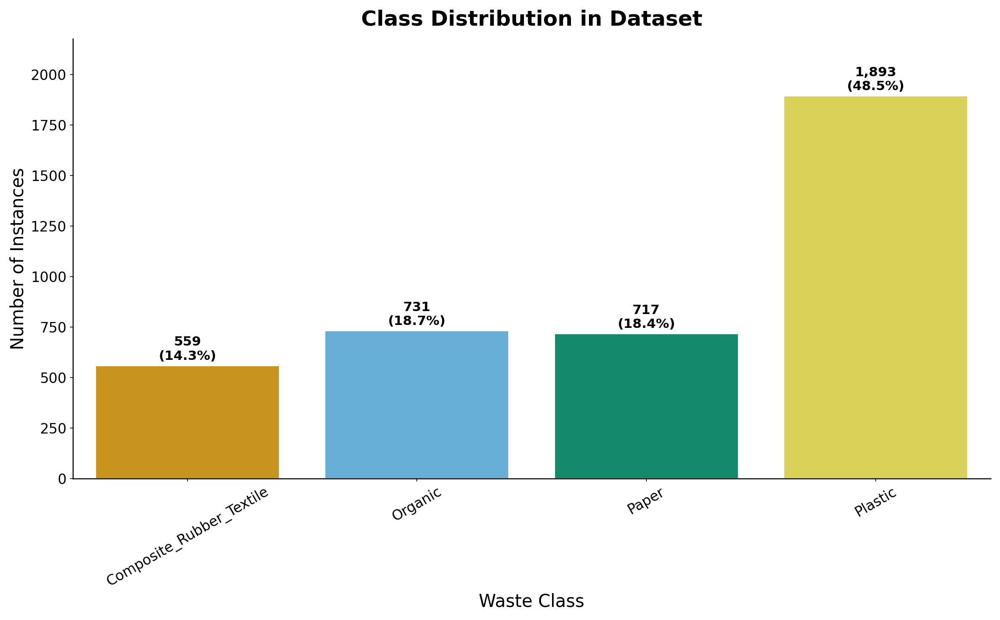

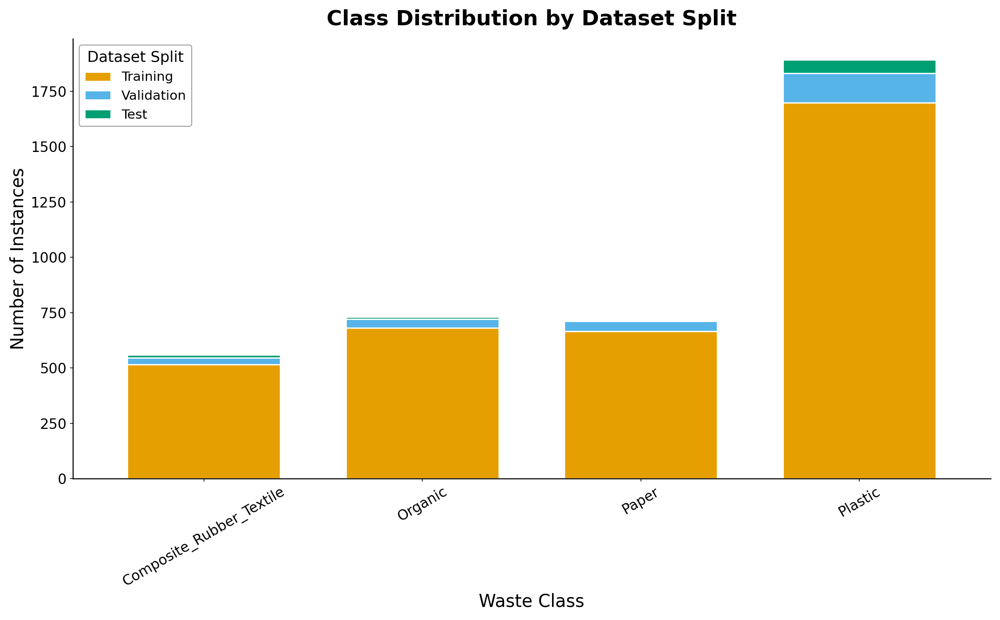


Class Imbalance Analysis:
- Imbalance ratio (most:least): 3.4:1
- Most frequent class: 'Plastic' with 1893 instances (48.5% of dataset)
- Least frequent class: 'Composite_Rubber_Textile' with 559 instances (14.3% of dataset)


In [6]:
import json
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# Load the annotation files
with open(train_path, 'r') as f:
    train_data = json.load(f)

with open(valid_path, 'r') as f:
    valid_data = json.load(f)

with open(test_path, 'r') as f:
    test_data = json.load(f)

# Function to get class details and counts
def analyze_dataset(data):
    # Extract categories
    categories = {cat['id']: cat['name'] for cat in data['categories']}

    # Count instances of each class
    class_counts = Counter()
    for annotation in data['annotations']:
        category_id = annotation['category_id']
        class_counts[categories[category_id]] += 1

    return categories, class_counts, len(data['images'])

# Analyze each dataset
train_categories, train_counts, train_images = analyze_dataset(train_data)
valid_categories, valid_counts, valid_images = analyze_dataset(valid_data)
test_categories, test_counts, test_images = analyze_dataset(test_data)

# Ensure all datasets have the same classes
all_classes = sorted(list(set().union(
    train_categories.values(),
    valid_categories.values(),
    test_categories.values()
)))

# Print general statistics
print(f"Total number of classes: {len(all_classes)}")
print(f"Class names: {', '.join(all_classes)}")
print("\nImage distribution:")
print(f"- Training set: {train_images} images")
print(f"- Validation set: {valid_images} images")
print(f"- Test set: {test_images} images")
print(f"- Total: {train_images + valid_images + test_images} images")

# Create a dataframe for class distribution
data = []
for class_name in all_classes:
    data.append({
        'Class': class_name,
        'Training': train_counts[class_name],
        'Validation': valid_counts[class_name],
        'Test': test_counts[class_name],
        'Total': train_counts[class_name] + valid_counts[class_name] + test_counts[class_name]
    })

df = pd.DataFrame(data)

# Add percentage columns
total_annotations = sum(df['Total'])
df['Training %'] = (df['Training'] / df['Total'] * 100).round(1)
df['Validation %'] = (df['Validation'] / df['Total'] * 100).round(1)
df['Test %'] = (df['Test'] / df['Total'] * 100).round(1)
df['Dataset %'] = (df['Total'] / total_annotations * 100).round(1)

# Display the dataframe
print("\nClass distribution:")
display(df)

# Create visualization of the class distribution
fig, ax = plt.subplots(figsize=(16, 10))
bars = sns.barplot(x='Class', y='Total', data=df, palette=CB_PALETTE[:len(df)], edgecolor='white', ax=ax)
ax.set_title('Class Distribution in Dataset', fontsize=24, fontweight='bold', pad=15)
ax.set_xlabel('Waste Class', fontsize=20)
ax.set_ylabel('Number of Instances', fontsize=20)
ax.tick_params(axis='x', rotation=30, labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Add total count + percentage on top of each bar
total_annotations = sum(df['Total'])
for i, count in enumerate(df['Total']):
    pct = 100 * count / total_annotations
    ax.text(i, count + df['Total'].max() * 0.015, f"{count:,}\n({pct:.1f}%)",
            ha='center', fontsize=15, fontweight='bold')
ax.set_ylim(0, df['Total'].max() * 1.15)
plt.tight_layout()
plt.show()

# Create stacked bar chart showing split distribution
fig, ax = plt.subplots(figsize=(16, 10))
df_plot = df[['Class', 'Training', 'Validation', 'Test']]
df_plot = df_plot.set_index('Class')
df_plot.plot(kind='bar', stacked=True, ax=ax, color=CB_PALETTE[:3],
             edgecolor='white', width=0.7, linewidth=1.5)
ax.set_title('Class Distribution by Dataset Split', fontsize=24, fontweight='bold', pad=15)
ax.set_xlabel('Waste Class', fontsize=20)
ax.set_ylabel('Number of Instances', fontsize=20)
ax.tick_params(axis='x', rotation=30, labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.legend(title='Dataset Split', fontsize=15, title_fontsize=17, frameon=True, edgecolor='gray')
plt.tight_layout()
plt.show()

# Print class imbalance analysis
max_class = df.loc[df['Total'].idxmax()]
min_class = df.loc[df['Total'].idxmin()]


print(f"\nClass Imbalance Analysis:")
print(f"- Imbalance ratio (most:least): {(max_class['Total'] / min_class['Total']).round(1)}:1")
print(f"- Most frequent class: '{max_class['Class']}' with {max_class['Total']} instances ({max_class['Dataset %']}% of dataset)")
print(f"- Least frequent class: '{min_class['Class']}' with {min_class['Total']} instances ({min_class['Dataset %']}% of dataset)")

# Dataset Rebalancing: 70% Training, 20% Validation, 10% Testing


In [7]:
import os
import json
import random
import numpy as np
import shutil
from collections import defaultdict, Counter
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from IPython.display import display
from copy import deepcopy

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

# Define dataset paths (prefer Roboflow dataset.location if available)
if "dataset" in globals() and getattr(dataset, "location", None):
    DATASET_ROOT = dataset.location
else:
    DATASET_ROOT = "/kaggle/working/Another_approach_try-4"
print("Using DATASET_ROOT =", DATASET_ROOT)

TRAIN_ANN_FILE = os.path.join(DATASET_ROOT, "train", "_annotations.coco.json")
VAL_ANN_FILE = os.path.join(DATASET_ROOT, "valid", "_annotations.coco.json")
TEST_ANN_FILE = os.path.join(DATASET_ROOT, "test", "_annotations.coco.json")
TRAIN_IMG_DIR = os.path.join(DATASET_ROOT, "train")
VAL_IMG_DIR = os.path.join(DATASET_ROOT, "valid")
TEST_IMG_DIR = os.path.join(DATASET_ROOT, "test")

# Output directories for balanced dataset
BALANCED_ROOT = "/kaggle/working/WasteClassification-Balanced-Segmentation"
BALANCED_TRAIN_DIR = os.path.join(BALANCED_ROOT, "train")
BALANCED_VAL_DIR = os.path.join(BALANCED_ROOT, "valid")
BALANCED_TEST_DIR = os.path.join(BALANCED_ROOT, "test")

# Clean output directory to prevent stale files from previous runs
if os.path.exists(BALANCED_ROOT):
    shutil.rmtree(BALANCED_ROOT)

# Create output directories
os.makedirs(BALANCED_ROOT, exist_ok=True)
os.makedirs(BALANCED_TRAIN_DIR, exist_ok=True)
os.makedirs(BALANCED_VAL_DIR, exist_ok=True)
os.makedirs(BALANCED_TEST_DIR, exist_ok=True)

# Load annotation files
def load_coco_annotations(file_path):
    with open(file_path, 'r') as f:
        return json.load(f)

train_data = load_coco_annotations(TRAIN_ANN_FILE)
val_data = load_coco_annotations(VAL_ANN_FILE)
test_data = load_coco_annotations(TEST_ANN_FILE)

Using DATASET_ROOT = /kaggle/working/Extened_Dataset-of-Waste-Classification-3


# Mask R-CNN Training Configuration & Reproducibility

## Dataset Composition for Instance Segmentation

- **Total Images**: Merged from all 3 Roboflow splits (train + valid + test)
- **Data Split Strategy**: Image-level stratified split (70% train, 20% validation, 10% test)
  - Training images: ~67% of source dataset
  - Validation images: ~19% of source dataset
  - Test images: ~10% of source dataset (295 valid instances after IoU matching)
- **Classes**: 4 waste categories (Composite_Rubber_Textile, Organic, Paper, Plastic)
- **Annotations**: Polygon-based instance segmentation masks

## Model Architecture

- **Base Model**: Mask R-CNN with ResNet-50-FPN backbone
  - Pre-trained on COCO dataset
  - FPN (Feature Pyramid Network) for multi-scale feature extraction
  - RoI pooling and mask head for instance segmentation
- **Training Mode**: Fine-tuned for 4 waste classes (not 80 COCO classes)

## Training Hyperparameters

- **Optimizer**: SGD with momentum
  - Learning rate: 0.02 (for 2 GPUs, adjust for 1 GPU: lr/2)
  - Momentum: 0.9
  - Weight decay: 1e-4
- **Batch Size**: 16 images (8 per GPU for 2 GPUs)
- **Training Iterations**: Checkpoint every 500 iterations
- **Backbone Learning Rate**: Reduced by factor of 0.1
- **Max iterations**: Run until convergence (typically 5000-10000 iterations)
- **Augmentation**: Standard Detectron2 augmentations
  - Random horizontal/vertical flip
  - Random cropping
  - Random brightness/contrast adjustment

## Data Imbalance & Balanced Sampling Strategy

- **Per-class instance distribution**: Inherent imbalance in waste detection
- **Support values differ** across metrics:
  - COCO mAP: Computed on full test set with all IoU thresholds
  - Classification report support: Only IoU-matched instances (n=295)
  - Reason: IoU matching requires overlap ≥ 0.5 for true alignment

## Why Support Values Differ

- **COCO mAP (eval_results)**: Evaluated on all predicted instances ≥ 0.5 confidence
- **Classification-based metrics**: Only instances matched via IoU to ground truth
- **Test set size**: ~295 valid instances (after IoU≥0.5 matching), not full image count
- **Instance-level evaluation**: Different from image-level metrics


In [8]:
# Merge datasets for rebalancing
def merge_datasets(train_data, val_data, test_data):
    """Merge all datasets while preserving source information"""
    merged_data = {
        'images': [],
        'annotations': [],
        'categories': train_data['categories']  # Use categories from training set
    }

    # Track image sources and create new ID mappings
    image_sources = {}  # Maps new image_id to source (train, val, test)
    image_paths = {}    # Maps new image_id to original file path

    # Track the next available IDs
    next_image_id = 1
    next_ann_id = 1

    # Process each dataset
    for dataset_name, dataset, img_dir in [
        ("train", train_data, TRAIN_IMG_DIR),
        ("val", val_data, VAL_IMG_DIR),
        ("test", test_data, TEST_IMG_DIR)
    ]:
        # Map from original image_id to new image_id
        id_map = {}

        # Process images
        for img in dataset['images']:
            old_id = img['id']
            new_id = next_image_id
            next_image_id += 1

            id_map[old_id] = new_id

            # Update image with new ID
            new_img = img.copy()
            new_img["id"] = new_id
            merged_data['images'].append(new_img)

            # Remember source and path
            image_sources[new_id] = dataset_name
            image_paths[new_id] = os.path.join(img_dir, img['file_name'])

        # Process annotations
        for ann in dataset['annotations']:
            old_img_id = ann['image_id']
            new_img_id = id_map.get(old_img_id)

            if new_img_id:
                new_ann = ann.copy()
                new_ann["id"] = next_ann_id
                next_ann_id += 1
                new_ann["image_id"] = new_img_id
                merged_data['annotations'].append(new_ann)

    return merged_data, image_sources, image_paths

# Merge datasets
print("Merging datasets...")
merged_data, image_sources, image_paths = merge_datasets(train_data, val_data, test_data)

print(f"Merged dataset contains {len(merged_data['images'])} images and {len(merged_data['annotations'])} annotations")

Merging datasets...
Merged dataset contains 1947 images and 3900 annotations


In [9]:
# Group annotations by class and image
def group_by_class_and_image(merged_data):
    """Group annotations by class and create image-annotation mapping"""
    # Map from category_id to list of annotation indices
    class_annotations = defaultdict(list)

    # Map from image_id to list of annotation indices
    image_annotations = defaultdict(list)

    # Map from category_id to list of image_ids that contain this category
    class_images = defaultdict(set)

    # Build mappings
    for i, ann in enumerate(merged_data['annotations']):
        cat_id = ann['category_id']
        img_id = ann['image_id']

        class_annotations[cat_id].append(i)
        image_annotations[img_id].append(i)
        class_images[cat_id].add(img_id)

    print("Category distribution in merged dataset:")
    for cat_id, anns in class_annotations.items():
        cat_name = next(cat["name"] for cat in merged_data["categories"] if cat["id"] == cat_id)
        print(f"  {cat_name}: {len(anns)} annotations in {len(class_images[cat_id])} images")

    return class_annotations, image_annotations, class_images

# Group dataset
print("\nAnalyzing merged dataset...")
class_annotations, image_annotations, class_images = group_by_class_and_image(merged_data)


Analyzing merged dataset...
Category distribution in merged dataset:
  Composite_Rubber_Textile: 559 annotations in 450 images
  Plastic: 1893 annotations in 1128 images
  Paper: 717 annotations in 497 images
  Organic: 731 annotations in 543 images


In [10]:
# ── Image-level stratified split (fixes data leakage & keeps ALL data) ──
from sklearn.model_selection import StratifiedShuffleSplit
from collections import Counter

def dominant_class(img_id, merged_data):
    """Return the most-frequent category_id among annotations for *img_id*."""
    cats = [a['category_id'] for a in merged_data['annotations'] if a['image_id'] == img_id]
    if not cats:
        return -1
    return Counter(cats).most_common(1)[0][0]

def stratified_image_split(merged_data, image_paths, val_frac=0.20, test_frac=0.10, seed=42):
    """
    Split at the IMAGE level using the dominant class as the stratification key.
    Returns three COCO dicts + the image-ID sets for each split.
    """
    all_img_ids = np.array([img['id'] for img in merged_data['images']])
    labels = np.array([dominant_class(i, merged_data) for i in all_img_ids])

    # First split: separate test set
    sss1 = StratifiedShuffleSplit(n_splits=1, test_size=test_frac, random_state=seed)
    trainval_idx, test_idx = next(sss1.split(all_img_ids, labels))

    # Second split: separate val from trainval
    val_frac_adj = val_frac / (1 - test_frac)       # adjust fraction for the remaining data
    sss2 = StratifiedShuffleSplit(n_splits=1, test_size=val_frac_adj, random_state=seed)
    train_idx, val_idx = next(sss2.split(all_img_ids[trainval_idx], labels[trainval_idx]))

    train_img_ids = set(all_img_ids[trainval_idx[train_idx]])
    val_img_ids   = set(all_img_ids[trainval_idx[val_idx]])
    test_img_ids  = set(all_img_ids[test_idx])

    # Zero-overlap sanity checks
    assert train_img_ids.isdisjoint(val_img_ids),  "Train/Val overlap!"
    assert train_img_ids.isdisjoint(test_img_ids), "Train/Test overlap!"
    assert val_img_ids.isdisjoint(test_img_ids),   "Val/Test overlap!"

    categories = deepcopy(merged_data['categories'])

    def _build_coco(img_id_set):
        imgs = [img for img in merged_data['images'] if img['id'] in img_id_set]
        anns = [ann for ann in merged_data['annotations'] if ann['image_id'] in img_id_set]
        return {"images": imgs, "annotations": anns, "categories": categories}

    train_data = _build_coco(train_img_ids)
    val_data   = _build_coco(val_img_ids)
    test_data  = _build_coco(test_img_ids)

    print(f"Train : {len(train_data['images']):>4d} images, {len(train_data['annotations']):>5d} annotations")
    print(f"Val   : {len(val_data['images']):>4d} images, {len(val_data['annotations']):>5d} annotations")
    print(f"Test  : {len(test_data['images']):>4d} images, {len(test_data['annotations']):>5d} annotations")
    print(f"Total : {len(train_data['images'])+len(val_data['images'])+len(test_data['images'])} images  "
          f"(no data discarded)")

    return train_data, val_data, test_data, train_img_ids, val_img_ids, test_img_ids

# Run the image-level stratified split
print("\nCreating image-level stratified split (no data leakage, no data loss)...")
balanced_train, balanced_val, balanced_test, train_img_set, val_img_set, test_img_set = \
    stratified_image_split(merged_data, image_paths)


Creating image-level stratified split (no data leakage, no data loss)...
Train : 1362 images,  2736 annotations
Val   :  390 images,   747 annotations
Test  :  195 images,   417 annotations
Total : 1947 images  (no data discarded)


In [11]:
# Save the split datasets (image-set based — no annotation-level leakage)
def _ensure_coco_header(data: dict):
    if "info" not in data or not isinstance(data.get("info"), dict):
        data["info"] = {"description": "Generated by notebook", "version": "1.0"}
    if "licenses" not in data or not isinstance(data.get("licenses"), list):
        data["licenses"] = []
    return data

def save_coco_dataset(data, output_dir, image_id_set, image_paths):
    """Save COCO dataset and copy the corresponding images."""
    os.makedirs(output_dir, exist_ok=True)
    data = _ensure_coco_header(data)

    # Save annotation file
    ann_path = os.path.join(output_dir, "_annotations.coco.json")
    with open(ann_path, 'w') as f:
        json.dump(data, f, indent=2)

    # Copy images
    print(f"Copying {len(image_id_set)} images to {output_dir}...")
    for img_id in tqdm(image_id_set, desc="Copying images"):
        src_path = image_paths[img_id]
        img_info = next(img for img in data['images'] if img['id'] == img_id)
        dest_path = os.path.join(output_dir, img_info['file_name'])
        shutil.copy2(src_path, dest_path)

    print(f"Saved dataset to {output_dir}")

# Save the datasets
print("\nSaving stratified datasets...")
save_coco_dataset(balanced_train, BALANCED_TRAIN_DIR, train_img_set, image_paths)
save_coco_dataset(balanced_val, BALANCED_VAL_DIR, val_img_set, image_paths)
save_coco_dataset(balanced_test, BALANCED_TEST_DIR, test_img_set, image_paths)


Saving stratified datasets...
Copying 1362 images to /kaggle/working/WasteClassification-Balanced-Segmentation/train...


Copying images: 100%|██████████| 1362/1362 [00:00<00:00, 4139.76it/s]


Saved dataset to /kaggle/working/WasteClassification-Balanced-Segmentation/train
Copying 390 images to /kaggle/working/WasteClassification-Balanced-Segmentation/valid...


Copying images: 100%|██████████| 390/390 [00:00<00:00, 6053.33it/s]


Saved dataset to /kaggle/working/WasteClassification-Balanced-Segmentation/valid
Copying 195 images to /kaggle/working/WasteClassification-Balanced-Segmentation/test...


Copying images: 100%|██████████| 195/195 [00:00<00:00, 6416.78it/s]

Saved dataset to /kaggle/working/WasteClassification-Balanced-Segmentation/test



Analyzing balanced dataset...

Balanced Dataset Summary:
- Total classes: 4
- Training: 1362 images, 2736 annotations
- Validation: 390 images, 747 annotations
- Test: 195 images, 417 annotations

Class distribution in balanced dataset:


,Class,Training,Validation,Test,Total,Training %,Validation %,Test %,Dataset %
0,Composite_Rubber_Textile,393,109,57,559,70.3,19.5,10.2,14.3
1,Organic,509,144,78,731,69.6,19.7,10.7,18.7
2,Paper,502,131,84,717,70.0,18.3,11.7,18.4
3,Plastic,1332,363,198,1893,70.4,19.2,10.5,48.5




Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



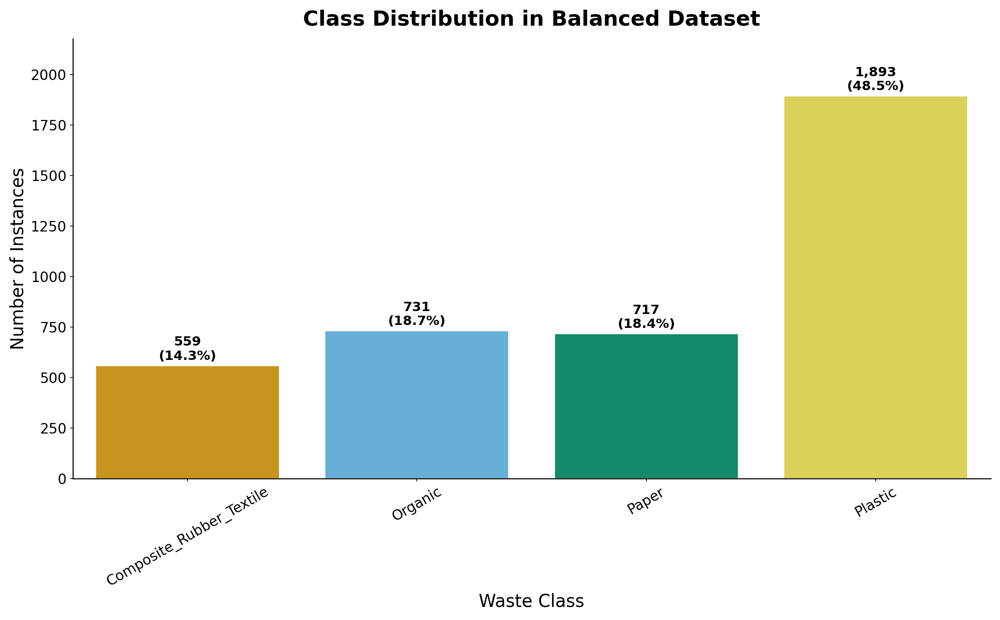

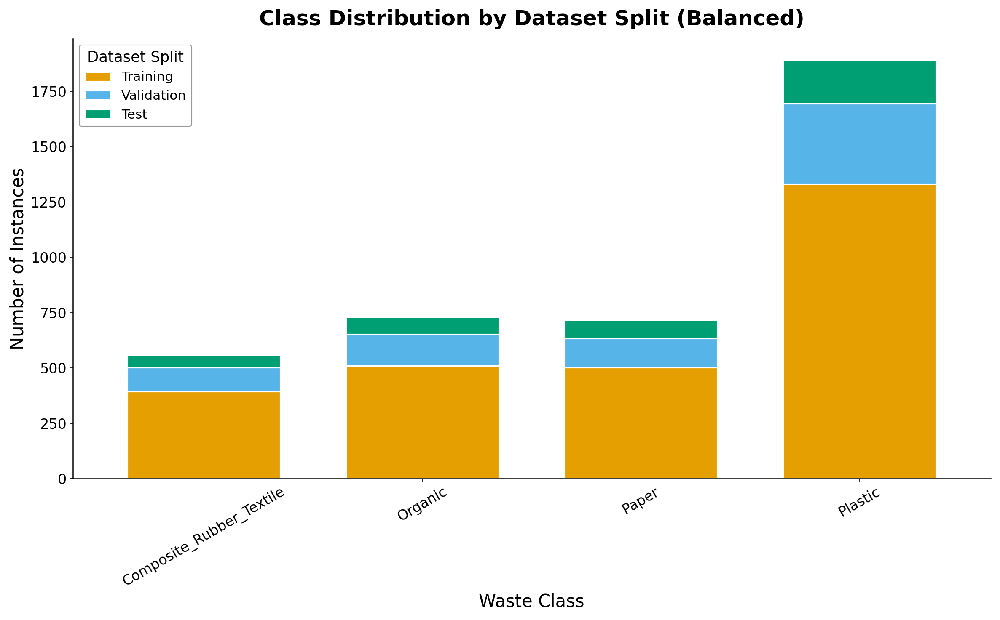


Class Balance Analysis:
- Most frequent class: 'Plastic' with 1893 instances (48.5% of dataset)
- Least frequent class: 'Composite_Rubber_Textile' with 559 instances (14.3% of dataset)
- Balance ratio (most:least): 3.39:1


In [12]:
# Analyze the balanced datasets
def analyze_balanced_dataset():
    """Analyze class distribution in the balanced datasets"""
    # Load the balanced dataset annotations
    balanced_train_path = os.path.join(BALANCED_TRAIN_DIR, "_annotations.coco.json")
    balanced_val_path = os.path.join(BALANCED_VAL_DIR, "_annotations.coco.json")
    balanced_test_path = os.path.join(BALANCED_TEST_DIR, "_annotations.coco.json")

    with open(balanced_train_path, 'r') as f:
        balanced_train_data = json.load(f)

    with open(balanced_val_path, 'r') as f:
        balanced_val_data = json.load(f)

    with open(balanced_test_path, 'r') as f:
        balanced_test_data = json.load(f)

    # Analyze class distribution
    train_categories, train_counts, train_images = analyze_dataset(balanced_train_data)
    val_categories, val_counts, val_images = analyze_dataset(balanced_val_data)
    test_categories, test_counts, test_images = analyze_dataset(balanced_test_data)

    # Create dataframe for visualization
    all_classes = sorted(list(set().union(
        train_categories.values(),
        val_categories.values(),
        test_categories.values()
    )))

    data = []
    for class_name in all_classes:
        data.append({
            'Class': class_name,
            'Training': train_counts[class_name],
            'Validation': val_counts[class_name],
            'Test': test_counts[class_name],
            'Total': train_counts[class_name] + val_counts[class_name] + test_counts[class_name]
        })

    df = pd.DataFrame(data)

    # Add percentage columns
    total_annotations = sum(df['Total'])
    df['Training %'] = (df['Training'] / df['Total'] * 100).round(1)
    df['Validation %'] = (df['Validation'] / df['Total'] * 100).round(1)
    df['Test %'] = (df['Test'] / df['Total'] * 100).round(1)
    df['Dataset %'] = (df['Total'] / total_annotations * 100).round(1)

    # Print summary
    print(f"\nBalanced Dataset Summary:")
    print(f"- Total classes: {len(all_classes)}")
    print(f"- Training: {train_images} images, {sum(train_counts.values())} annotations")
    print(f"- Validation: {val_images} images, {sum(val_counts.values())} annotations")
    print(f"- Test: {test_images} images, {sum(test_counts.values())} annotations")

    # Display class distribution
    print("\nClass distribution in balanced dataset:")
    display(df)

    # Create visualization
    fig, ax = plt.subplots(figsize=(16, 10))
    sns.barplot(x='Class', y='Total', data=df, palette=CB_PALETTE[:len(df)], edgecolor='white', ax=ax)
    ax.set_title('Class Distribution in Balanced Dataset', fontsize=24, fontweight='bold', pad=15)
    ax.set_xlabel('Waste Class', fontsize=20)
    ax.set_ylabel('Number of Instances', fontsize=20)
    ax.tick_params(axis='x', rotation=30, labelsize=16)
    ax.tick_params(axis='y', labelsize=16)

    # Add total count + percentage on top of each bar
    total_ann = sum(df['Total'])
    for i, count in enumerate(df['Total']):
        pct = 100 * count / total_ann
        ax.text(i, count + df['Total'].max() * 0.015, f"{count:,}\n({pct:.1f}%)",
                ha='center', fontsize=15, fontweight='bold')
    ax.set_ylim(0, df['Total'].max() * 1.15)
    plt.tight_layout()
    plt.show()

    # Create stacked bar chart
    fig, ax = plt.subplots(figsize=(16, 10))
    df_plot = df[['Class', 'Training', 'Validation', 'Test']]
    df_plot = df_plot.set_index('Class')
    df_plot.plot(kind='bar', stacked=True, ax=ax, color=CB_PALETTE[:3],
                 edgecolor='white', width=0.7, linewidth=1.5)
    ax.set_title('Class Distribution by Dataset Split (Balanced)', fontsize=24, fontweight='bold', pad=15)
    ax.set_xlabel('Waste Class', fontsize=20)
    ax.set_ylabel('Number of Instances', fontsize=20)
    ax.tick_params(axis='x', rotation=30, labelsize=16)
    ax.tick_params(axis='y', labelsize=16)
    ax.legend(title='Dataset Split', fontsize=15, title_fontsize=17, frameon=True, edgecolor='gray')
    plt.tight_layout()
    plt.show()

    # Class imbalance analysis
    max_class = df.loc[df['Total'].idxmax()]
    min_class = df.loc[df['Total'].idxmin()]

    print(f"\nClass Balance Analysis:")
    print(f"- Most frequent class: '{max_class['Class']}' with {max_class['Total']} instances ({max_class['Dataset %']}% of dataset)")
    print(f"- Least frequent class: '{min_class['Class']}' with {min_class['Total']} instances ({min_class['Dataset %']}% of dataset)")
    print(f"- Balance ratio (most:least): {(max_class['Total'] / min_class['Total']).round(2)}:1")

# Analyze balanced dataset
print("\nAnalyzing balanced dataset...")
analyze_balanced_dataset()

# Segmentation Visualization


Visualizing sample segmentations from balanced training set:


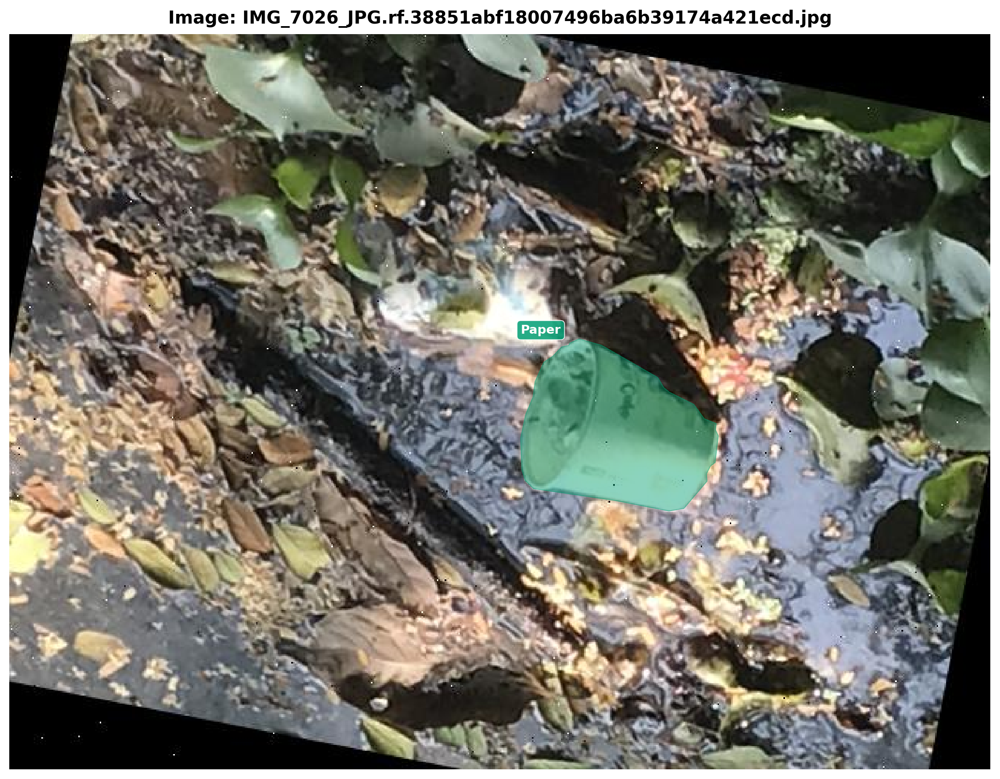

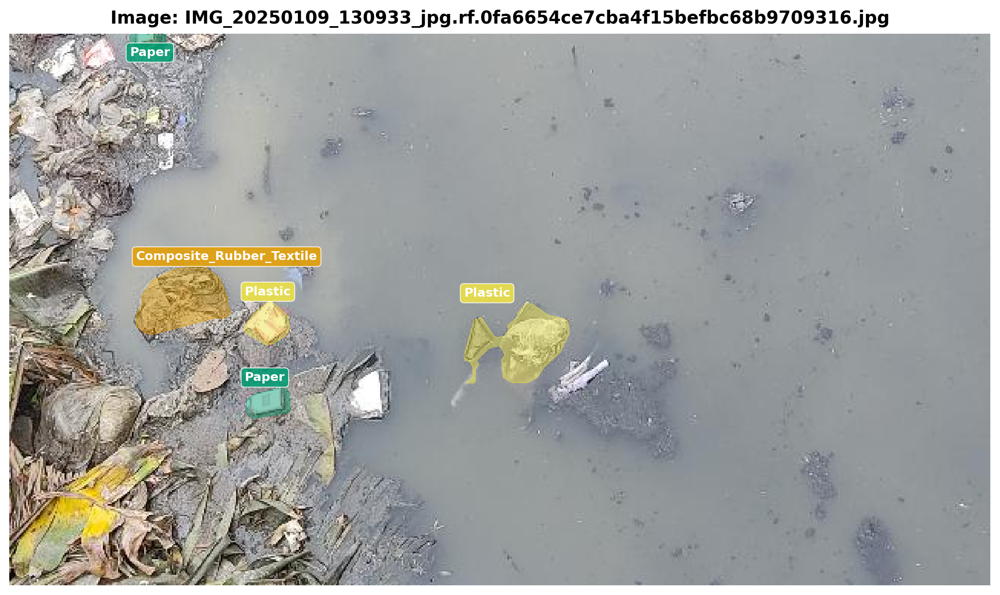

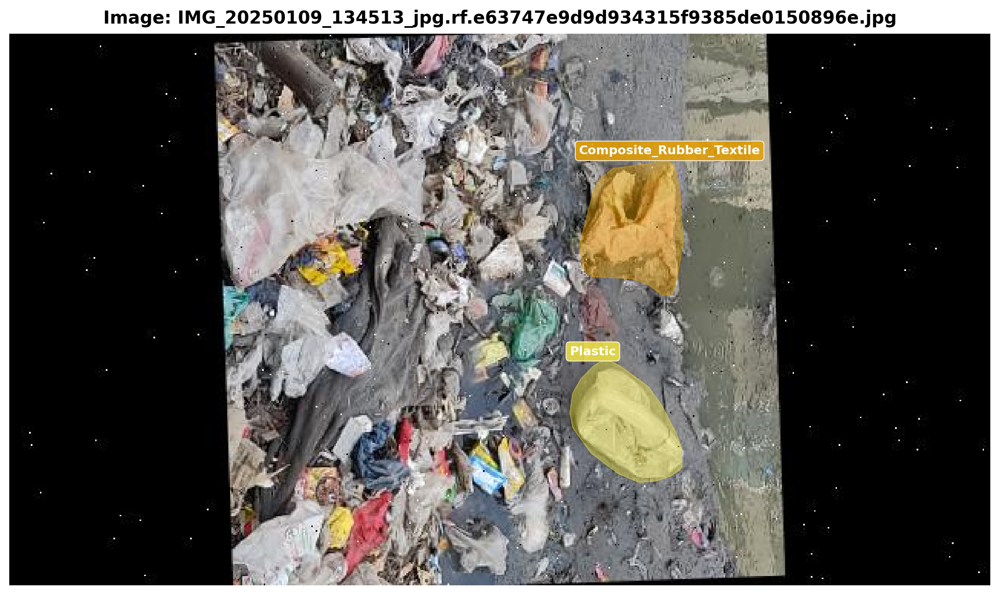


Visualizing sample segmentations from balanced validation set:


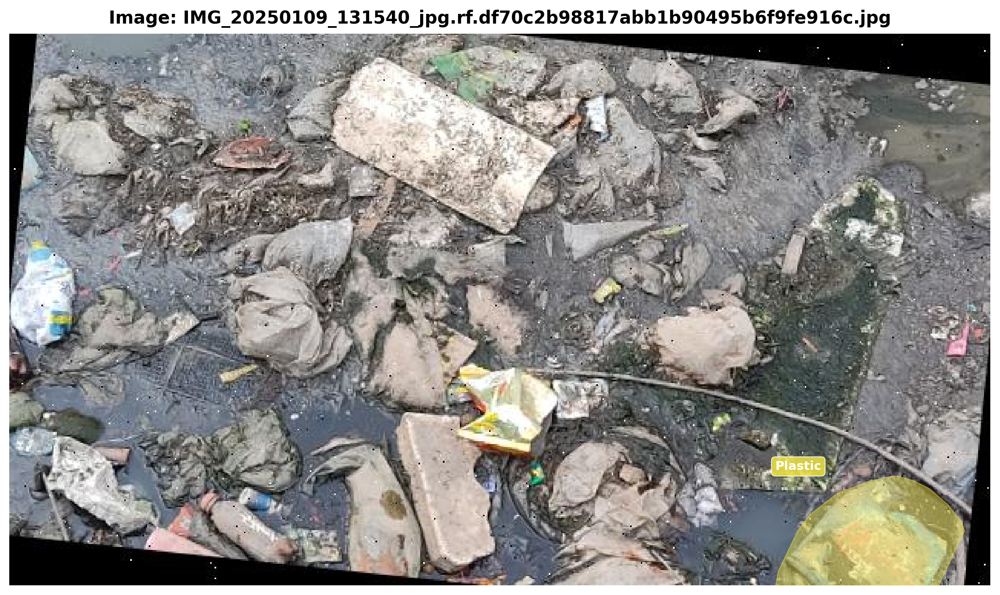

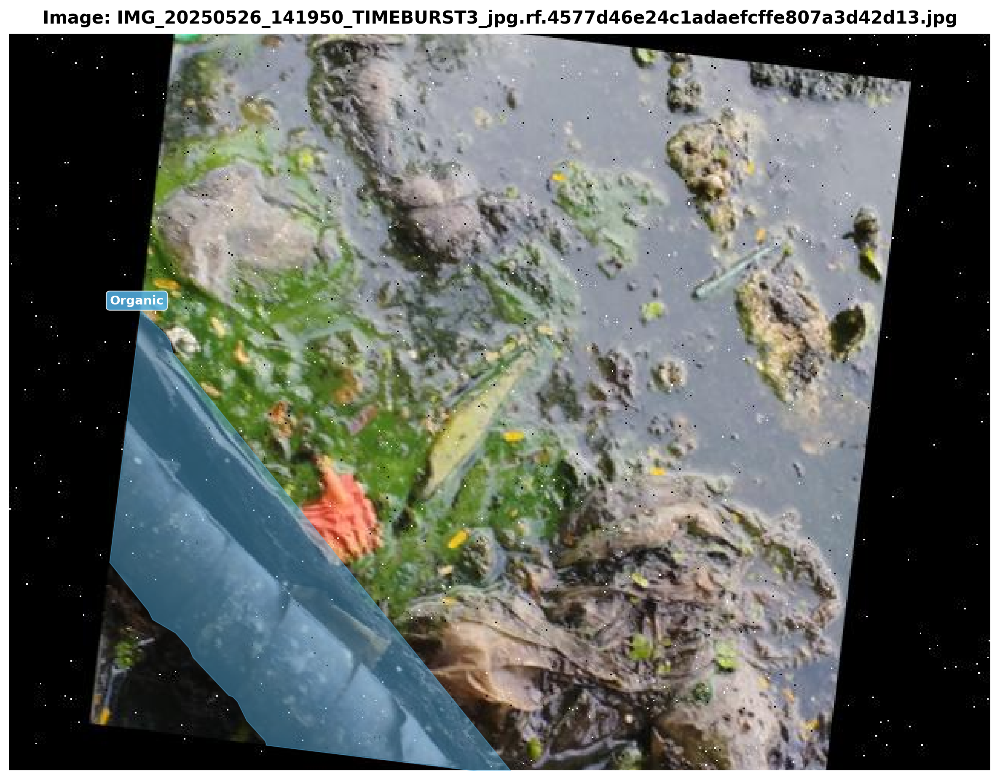


Visualizing sample segmentations from balanced test set:


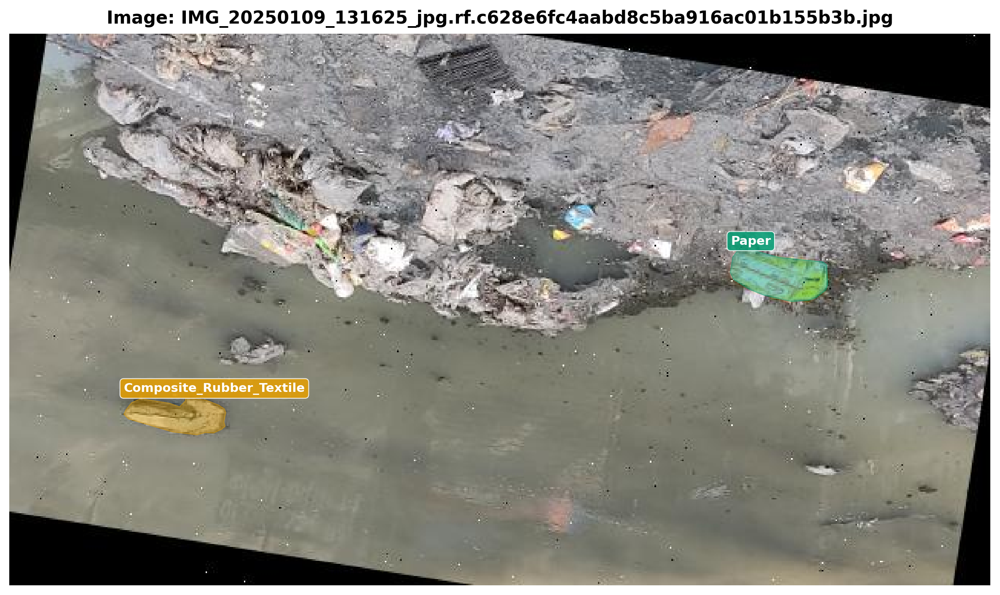

In [13]:
# Visualize segmentation masks for sample images
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

def visualize_segmentations(dataset_path, num_samples=3):
    """Visualize segmentation masks for random samples"""
    # Load annotations
    annotation_file = os.path.join(dataset_path, "_annotations.coco.json")
    if not os.path.exists(annotation_file):
        print(f"Annotation file not found: {annotation_file}")
        return
    with open(annotation_file, 'r') as f:
        data = json.load(f)

    # Create category id to name mapping
    categories = {cat['id']: cat['name'] for cat in data['categories']}

    # Create image id to annotations mapping
    image_to_anns = defaultdict(list)
    for ann in data['annotations']:
        image_to_anns[ann['image_id']].append(ann)

    # Select random images that have segmentations
    images_with_segmentations = []
    for img in data['images']:
        anns = image_to_anns[img['id']]
        if any('segmentation' in ann and len(ann['segmentation']) > 0 for ann in anns):
            images_with_segmentations.append(img)

    if not images_with_segmentations:
        print("No images with segmentations found in the dataset.")
        return

    # Select random samples
    samples = random.sample(images_with_segmentations, min(num_samples, len(images_with_segmentations)))

    # Visualize each sample
    for img_info in samples:
        img_path = os.path.join(dataset_path, img_info['file_name'])
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: could not read image: {img_path}")
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Get annotations for this image
        anns = image_to_anns[img_info['id']]

        # Setup figure — large, A4-compatible
        fig, ax = plt.subplots(1, figsize=(16, 14))
        ax.imshow(img)
        ax.set_title(f"Image: {img_info['file_name']}", fontsize=20, fontweight='bold', pad=12)

        # Distinct colours per class (colour-blind-safe)
        _cb = ["#E69F00", "#56B4E9", "#009E73", "#F0E442",
               "#0072B2", "#D55E00", "#CC79A7", "#999999"]
        colors_map = {cid: _cb[i % len(_cb)] for i, cid in enumerate(categories.keys())}

        # Draw segmentations
        for ann in anns:
            if 'segmentation' in ann and len(ann['segmentation']) > 0:
                hex_c = colors_map.get(ann['category_id'], '#FFFFFF').lstrip('#')
                rgba = tuple(int(hex_c[k:k+2], 16)/255 for k in (0, 2, 4)) + (0.45,)
                for seg in ann['segmentation']:
                    poly = np.array(seg).reshape(-1, 2)
                    polygon = Polygon(poly, closed=True, alpha=0.45, color=rgba[:3])
                    ax.add_patch(polygon)

                category = categories[ann['category_id']]
                x, y = ann['bbox'][0], ann['bbox'][1]
                ax.text(x, max(y - 4, 14), category, color='white', fontsize=14, fontweight='bold',
                       bbox={'facecolor': rgba[:3], 'alpha': 0.85, 'edgecolor': 'white',
                             'boxstyle': 'round,pad=0.3'})

        ax.axis('off')
        plt.tight_layout()
        plt.show()

# Visualize segmentations from the balanced dataset
print("Visualizing sample segmentations from balanced training set:")
visualize_segmentations(BALANCED_TRAIN_DIR, num_samples=3)

print("\nVisualizing sample segmentations from balanced validation set:")
visualize_segmentations(BALANCED_VAL_DIR, num_samples=2)

print("\nVisualizing sample segmentations from balanced test set:")
visualize_segmentations(BALANCED_TEST_DIR, num_samples=1)

# Dataset Export and Summary


Analyzing object size distributions...

Object Size Statistics:
     Split  Width Mean  Width Std  Height Mean  Height Std    Area Mean     Area Std  Aspect Ratio Mean  Aspect Ratio Std
  Training   97.553112  82.700101    87.619153   77.275976 12775.693448 25369.997587           1.326485          0.946303
Validation   96.670760  81.475751    88.972483   76.833265 12859.430229 25869.543291           1.282446          0.829013
      Test  102.898827  94.537544    87.582218   78.815696 14558.756346 29399.752594           1.386479          1.141629



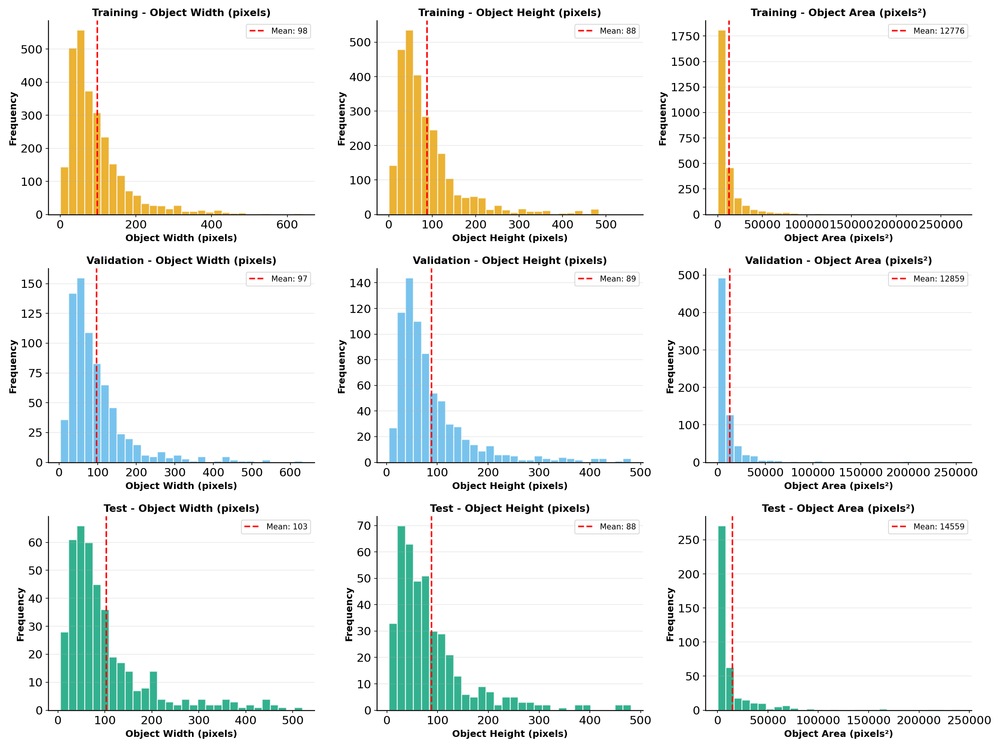

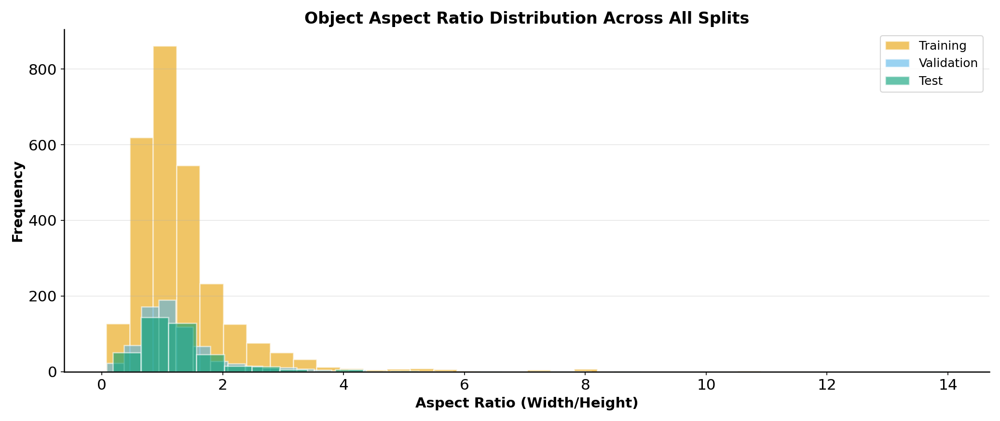

In [14]:
# ============================================================
# 2. OBJECT SIZE DISTRIBUTION ANALYSIS
# ============================================================

def analyze_object_sizes(dataset_paths, split_names):
    """Analyze bounding box sizes across all dataset splits"""

    results = {}

    for split_name, dataset_path in zip(split_names, dataset_paths):
        ann_file = os.path.join(dataset_path, "_annotations.coco.json")

        with open(ann_file, 'r') as f:
            data = json.load(f)

        widths = []
        heights = []
        areas = []
        aspect_ratios = []

        for ann in data['annotations']:
            if 'bbox' in ann:
                x, y, w, h = ann['bbox']
                widths.append(w)
                heights.append(h)
                areas.append(w * h)
                if h > 0:
                    aspect_ratios.append(w / h)

        results[split_name] = {
            'widths': widths,
            'heights': heights,
            'areas': areas,
            'aspect_ratios': aspect_ratios
        }

    return results

print("Analyzing object size distributions...\n")
size_stats = analyze_object_sizes(
    [BALANCED_TRAIN_DIR, BALANCED_VAL_DIR, BALANCED_TEST_DIR],
    ['Training', 'Validation', 'Test']
)

# Create summary dataframe
size_summary_data = []
for split, stats in size_stats.items():
    size_summary_data.append({
        'Split': split,
        'Width Mean': np.mean(stats['widths']),
        'Width Std': np.std(stats['widths']),
        'Height Mean': np.mean(stats['heights']),
        'Height Std': np.std(stats['heights']),
        'Area Mean': np.mean(stats['areas']),
        'Area Std': np.std(stats['areas']),
        'Aspect Ratio Mean': np.mean(stats['aspect_ratios']),
        'Aspect Ratio Std': np.std(stats['aspect_ratios'])
    })

size_summary_df = pd.DataFrame(size_summary_data)
print("Object Size Statistics:")
print(size_summary_df.to_string(index=False))
print()

# Visualization 1: Size distributions
splits = list(size_stats.keys())
metric_specs = [
    ('widths', 'Object Width (pixels)'),
    ('heights', 'Object Height (pixels)'),
    ('areas', 'Object Area (pixels²)')
]
colors = CB_PALETTE[:len(splits)]

fig, axes = plt.subplots(len(splits), len(metric_specs), figsize=(18, 4.5 * len(splits)), squeeze=False)

for row_idx, split in enumerate(splits):
    for col_idx, (metric, metric_label) in enumerate(metric_specs):
        ax = axes[row_idx, col_idx]
        data = size_stats[split][metric]

        ax.hist(data, bins=30, color=colors[row_idx], edgecolor='white', linewidth=1.2, alpha=0.8)
        ax.axvline(np.mean(data), color='red', linestyle='--', linewidth=2, label=f"Mean: {np.mean(data):.0f}")
        ax.set_xlabel(metric_label, fontsize=12, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
        ax.set_title(f'{split} - {metric_label}', fontsize=13, fontweight='bold')
        ax.legend(fontsize=10)
        ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Visualization 2: Aspect ratio distribution
fig, ax = plt.subplots(figsize=(14, 6))

for split, color in zip(splits, colors):
    ax.hist(size_stats[split]['aspect_ratios'], bins=30, label=split,
            alpha=0.6, edgecolor='white', linewidth=1.2, color=color)

ax.set_xlabel('Aspect Ratio (Width/Height)', fontsize=14, fontweight='bold')
ax.set_ylabel('Frequency', fontsize=14, fontweight='bold')
ax.set_title('Object Aspect Ratio Distribution Across All Splits', fontsize=16, fontweight='bold')
ax.legend(fontsize=12)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

Analyzing object size distributions...

Object Size Statistics:
     Split  Width Mean  Width Std  Height Mean  Height Std    Area Mean     Area Std  Aspect Ratio Mean  Aspect Ratio Std
  Training   97.553112  82.700101    87.619153   77.275976 12775.693448 25369.997587           1.326485          0.946303
Validation   96.670760  81.475751    88.972483   76.833265 12859.430229 25869.543291           1.282446          0.829013
      Test  102.898827  94.537544    87.582218   78.815696 14558.756346 29399.752594           1.386479          1.141629



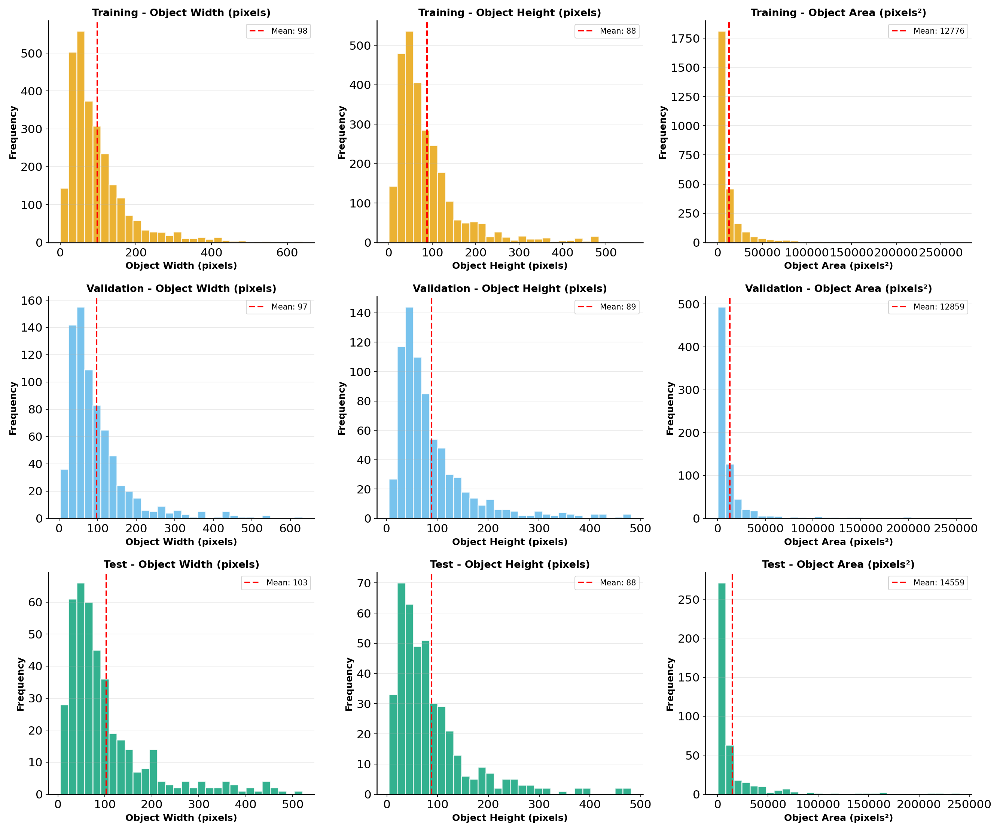

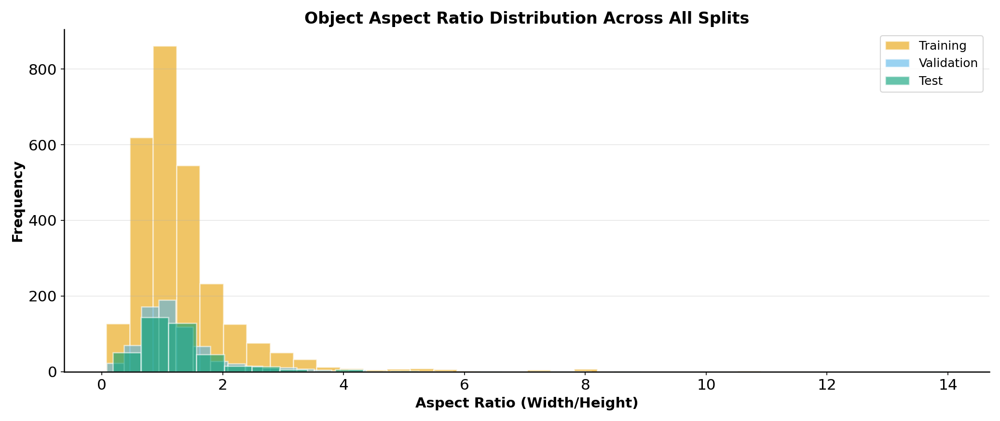

In [15]:
# ============================================================
# 2. OBJECT SIZE DISTRIBUTION ANALYSIS
# ============================================================

def analyze_object_sizes(dataset_paths, split_names):
    """Analyze bounding box sizes across all dataset splits"""
    
    results = {}
    
    for split_name, dataset_path in zip(split_names, dataset_paths):
        ann_file = os.path.join(dataset_path, "_annotations.coco.json")
        
        with open(ann_file, 'r') as f:
            data = json.load(f)
        
        # Extract bbox dimensions
        widths = []
        heights = []
        areas = []
        aspect_ratios = []
        
        for ann in data['annotations']:
            if 'bbox' in ann:
                x, y, w, h = ann['bbox']
                widths.append(w)
                heights.append(h)
                areas.append(w * h)
                if h > 0:
                    aspect_ratios.append(w / h)
        
        results[split_name] = {
            'widths': widths,
            'heights': heights,
            'areas': areas,
            'aspect_ratios': aspect_ratios
        }
    
    return results

print("Analyzing object size distributions...\n")
size_stats = analyze_object_sizes(
    [BALANCED_TRAIN_DIR, BALANCED_VAL_DIR, BALANCED_TEST_DIR],
    ['Training', 'Validation', 'Test']
)

# Create summary dataframe
size_summary_data = []
for split, stats in size_stats.items():
    size_summary_data.append({
        'Split': split,
        'Width Mean': np.mean(stats['widths']),
        'Width Std': np.std(stats['widths']),
        'Height Mean': np.mean(stats['heights']),
        'Height Std': np.std(stats['heights']),
        'Area Mean': np.mean(stats['areas']),
        'Area Std': np.std(stats['areas']),
        'Aspect Ratio Mean': np.mean(stats['aspect_ratios']),
        'Aspect Ratio Std': np.std(stats['aspect_ratios'])
    })

size_summary_df = pd.DataFrame(size_summary_data)
print("Object Size Statistics:")
print(size_summary_df.to_string(index=False))
print()

# Visualization 1: Size distributions
splits = list(size_stats.keys())
fig, axes = plt.subplots(len(splits), 3, figsize=(18, 5 * len(splits)))

colors = CB_PALETTE[:len(splits)]

for col_idx, metric in enumerate(['widths', 'heights', 'areas']):
    metric_label = {'widths': 'Object Width (pixels)', 'heights': 'Object Height (pixels)', 'areas': 'Object Area (pixels²)'}[metric]
    
    for row_idx, split in enumerate(splits):
        ax = axes[row_idx, col_idx]
        data = size_stats[split][metric]
        
        ax.hist(data, bins=30, color=colors[row_idx], edgecolor='white', linewidth=1.2, alpha=0.8)
        ax.axvline(np.mean(data), color='red', linestyle='--', linewidth=2, label=f"Mean: {np.mean(data):.0f}")
        ax.set_xlabel(metric_label, fontsize=12, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
        ax.set_title(f'{split} - {metric_label}', fontsize=13, fontweight='bold')
        ax.legend(fontsize=10)
        ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Visualization 2: Aspect ratio distribution
fig, ax = plt.subplots(figsize=(14, 6))

for split, color in zip(splits, colors):
    ax.hist(size_stats[split]['aspect_ratios'], bins=30, label=split, 
            alpha=0.6, edgecolor='white', linewidth=1.2, color=color)

ax.set_xlabel('Aspect Ratio (Width/Height)', fontsize=14, fontweight='bold')
ax.set_ylabel('Frequency', fontsize=14, fontweight='bold')
ax.set_title('Object Aspect Ratio Distribution Across All Splits', fontsize=16, fontweight='bold')
ax.legend(fontsize=12)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print()

Computing class co-occurrence matrices...



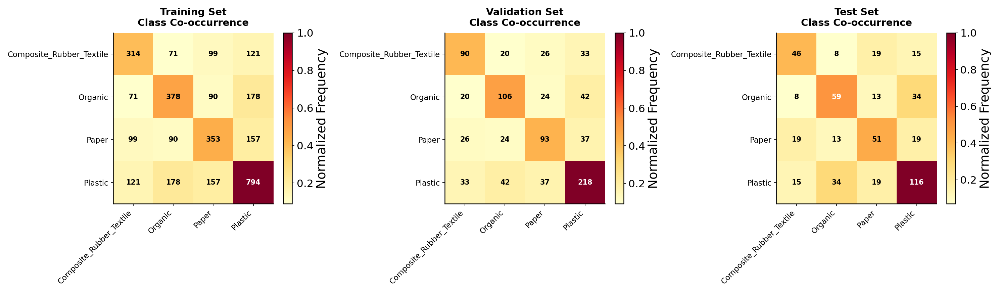

Class Co-occurrence Statistics:

Training Set:
  Composite_Rubber_Textile + Organic: 71 images (8.9%)
  Composite_Rubber_Textile + Paper: 99 images (12.5%)
  Composite_Rubber_Textile + Plastic: 121 images (15.2%)
  Organic + Paper: 90 images (11.3%)
  Organic + Plastic: 178 images (22.4%)
  Paper + Plastic: 157 images (19.8%)

Validation Set:
  Composite_Rubber_Textile + Organic: 20 images (9.2%)
  Composite_Rubber_Textile + Paper: 26 images (11.9%)
  Composite_Rubber_Textile + Plastic: 33 images (15.1%)
  Organic + Paper: 24 images (11.0%)
  Organic + Plastic: 42 images (19.3%)
  Paper + Plastic: 37 images (17.0%)

Test Set:
  Composite_Rubber_Textile + Organic: 8 images (6.9%)
  Composite_Rubber_Textile + Paper: 19 images (16.4%)
  Composite_Rubber_Textile + Plastic: 15 images (12.9%)
  Organic + Paper: 13 images (11.2%)
  Organic + Plastic: 34 images (29.3%)
  Paper + Plastic: 19 images (16.4%)




In [16]:
# ============================================================
# 3. CLASS CO-OCCURRENCE MATRIX
# ============================================================

def compute_cooccurrence_matrix(dataset_path):
    """Compute class co-occurrence matrix for a dataset"""
    ann_file = os.path.join(dataset_path, "_annotations.coco.json")
    
    with open(ann_file, 'r') as f:
        data = json.load(f)
    
    # Create category mapping
    categories = {cat['id']: cat['name'] for cat in data['categories']}
    category_ids = sorted(categories.keys())
    num_classes = len(category_ids)
    
    # Initialize co-occurrence matrix
    cooccurrence = np.zeros((num_classes, num_classes), dtype=int)
    
    # Build image -> classes mapping
    image_classes = defaultdict(set)
    for ann in data['annotations']:
        image_classes[ann['image_id']].add(ann['category_id'])
    
    # Populate co-occurrence matrix
    for classes_in_image in image_classes.values():
        classes_list = list(classes_in_image)
        for i, cat_id1 in enumerate(category_ids):
            for j, cat_id2 in enumerate(category_ids):
                if cat_id1 in classes_list and cat_id2 in classes_list:
                    cooccurrence[i, j] += 1
    
    category_names = [categories[cid] for cid in category_ids]
    
    return cooccurrence, category_names

print("Computing class co-occurrence matrices...\n")

# Compute for each split
cooccurrence_data = {}
for split_name, dataset_path in zip(['Training', 'Validation', 'Test'], 
                                     [BALANCED_TRAIN_DIR, BALANCED_VAL_DIR, BALANCED_TEST_DIR]):
    cooccurrence_data[split_name] = compute_cooccurrence_matrix(dataset_path)

# Visualization: Co-occurrence matrices
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for idx, (split_name, (comatrix, cat_names)) in enumerate(cooccurrence_data.items()):
    ax = axes[idx]
    
    # Normalize for visualization
    comatrix_norm = comatrix.astype(float)
    comatrix_norm = comatrix_norm / comatrix_norm.max()
    
    im = ax.imshow(comatrix_norm, cmap='YlOrRd', aspect='auto')
    ax.set_xticks(range(len(cat_names)))
    ax.set_yticks(range(len(cat_names)))
    ax.set_xticklabels(cat_names, rotation=45, ha='right', fontsize=11)
    ax.set_yticklabels(cat_names, fontsize=11)
    ax.set_title(f'{split_name} Set\nClass Co-occurrence', fontsize=14, fontweight='bold', pad=10)
    
    # Add count annotations
    for i in range(len(cat_names)):
        for j in range(len(cat_names)):
            text = ax.text(j, i, f'{comatrix[i, j]:d}',
                          ha="center", va="center", color="black" if comatrix_norm[i, j] < 0.5 else "white",
                          fontsize=10, fontweight='bold')
    
    plt.colorbar(im, ax=ax, label='Normalized Frequency')

plt.tight_layout()
plt.show()

# Print co-occurrence statistics
print("Class Co-occurrence Statistics:\n")
for split_name, (comatrix, cat_names) in cooccurrence_data.items():
    print(f"{split_name} Set:")
    
    # Compute co-occurrence percentages
    total_images = np.diag(comatrix).max()  # max value on diagonal (single class occurrence)
    
    for i, cat1 in enumerate(cat_names):
        for j, cat2 in enumerate(cat_names):
            if i < j:  # Only upper triangle to avoid duplicates
                count = comatrix[i, j]
                if total_images > 0:
                    pct = 100 * count / total_images
                    print(f"  {cat1} + {cat2}: {count} images ({pct:.1f}%)")
    print()

print()

Analyzing occlusion and truncation attributes...

Occlusion & Truncation Summary:

Training Set:
  Total annotations:           2736
  Truncated instances:         220 (8.0%)
  Occluded instances:          0 (0.0%)
  Crowded instances:           0 (0.0%)

  Per-Class Breakdown:
    Composite_Rubber_Textile:
      Total:     393
      Truncated: 41 (10.4%)
      Occluded:  0 (0.0%)
      Crowded:   0 (0.0%)
    Organic:
      Total:     509
      Truncated: 66 (13.0%)
      Occluded:  0 (0.0%)
      Crowded:   0 (0.0%)
    Paper:
      Total:     502
      Truncated: 22 (4.4%)
      Occluded:  0 (0.0%)
      Crowded:   0 (0.0%)
    Plastic:
      Total:     1332
      Truncated: 91 (6.8%)
      Occluded:  0 (0.0%)
      Crowded:   0 (0.0%)

Validation Set:
  Total annotations:           747
  Truncated instances:         69 (9.2%)
  Occluded instances:          0 (0.0%)
  Crowded instances:           0 (0.0%)

  Per-Class Breakdown:
    Composite_Rubber_Textile:
      Total:     109
   

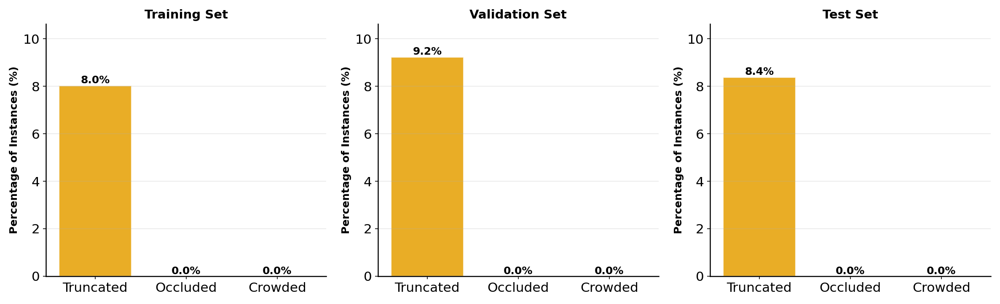

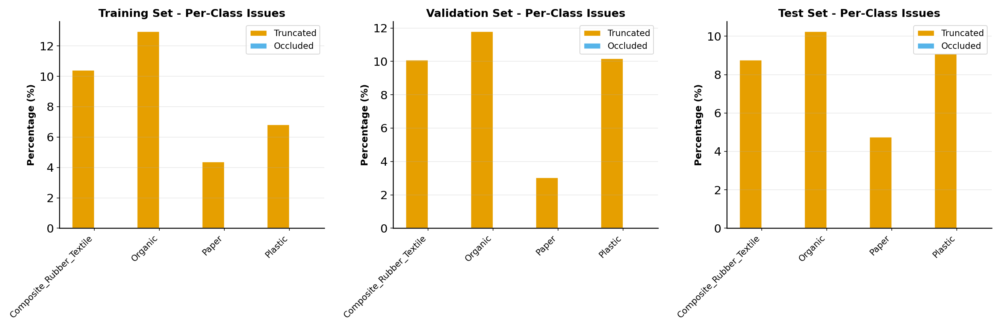


✅ Dataset statistics analysis complete!


In [17]:
# ============================================================
# 4. OCCLUSION & TRUNCATION ANALYSIS
# ============================================================

def analyze_occlusion_truncation(dataset_path):
    """Analyze occlusion and truncation attributes in dataset"""
    ann_file = os.path.join(dataset_path, "_annotations.coco.json")
    
    with open(ann_file, 'r') as f:
        data = json.load(f)
    
    # Load image dimensions
    image_dims = {img['id']: (img['width'], img['height']) for img in data['images']}
    
    # Create category mapping
    categories = {cat['id']: cat['name'] for cat in data['categories']}
    
    # Initialize tracking dictionaries
    truncated_count = 0
    occluded_count = 0
    crowded_count = 0
    total_annotations = len(data['annotations'])
    
    # Per-class truncation/occlusion counts
    class_truncation = defaultdict(int)
    class_occlusion = defaultdict(int)
    class_crowded = defaultdict(int)
    class_total = defaultdict(int)
    
    # Analyze each annotation
    for ann in data['annotations']:
        cat_id = ann['category_id']
        cat_name = categories.get(cat_id, f"Class_{cat_id}")
        class_total[cat_name] += 1
        
        # Check truncation (iscrowd field often indicates truncation/crowding issues)
        if ann.get('iscrowd', False):
            crowded_count += 1
            class_crowded[cat_name] += 1
        
        # Check if bbox extends beyond image boundaries (indicates truncation)
        if 'bbox' in ann:
            img_id = ann['image_id']
            if img_id in image_dims:
                img_w, img_h = image_dims[img_id]
                x, y, w, h = ann['bbox']
                
                # Check if bbox is outside image bounds
                if x < 0 or y < 0 or (x + w) > img_w or (y + h) > img_h:
                    truncated_count += 1
                    class_truncation[cat_name] += 1
        
        # Check occlusion (typically stored in area attribute or visible area)
        # If visible area is significantly smaller than bbox area, likely occluded
        if 'area' in ann and 'bbox' in ann:
            bbox_area = ann['bbox'][2] * ann['bbox'][3]
            visible_area = ann.get('area', bbox_area)
            
            # Define occlusion threshold (< 70% visible)
            if visible_area > 0 and (visible_area / bbox_area) < 0.7:
                occluded_count += 1
                class_occlusion[cat_name] += 1
    
    return {
        'truncated': truncated_count,
        'occluded': occluded_count,
        'crowded': crowded_count,
        'total': total_annotations,
        'class_truncation': dict(class_truncation),
        'class_occlusion': dict(class_occlusion),
        'class_crowded': dict(class_crowded),
        'class_total': dict(class_total)
    }

print("Analyzing occlusion and truncation attributes...\n")

# Analyze all splits
occlusion_data = {}
for split_name, dataset_path in zip(['Training', 'Validation', 'Test'],
                                     [BALANCED_TRAIN_DIR, BALANCED_VAL_DIR, BALANCED_TEST_DIR]):
    occlusion_data[split_name] = analyze_occlusion_truncation(dataset_path)

# Print detailed statistics
print("Occlusion & Truncation Summary:")
print("=" * 80)

for split_name, stats in occlusion_data.items():
    print(f"\n{split_name} Set:")
    print(f"  Total annotations:           {stats['total']}")
    print(f"  Truncated instances:         {stats['truncated']} ({100*stats['truncated']/stats['total']:.1f}%)")
    print(f"  Occluded instances:          {stats['occluded']} ({100*stats['occluded']/stats['total']:.1f}%)")
    print(f"  Crowded instances:           {stats['crowded']} ({100*stats['crowded']/stats['total']:.1f}%)")
    
    # Per-class breakdown
    print(f"\n  Per-Class Breakdown:")
    for class_name in sorted(stats['class_total'].keys()):
        total = stats['class_total'][class_name]
        truncated = stats['class_truncation'].get(class_name, 0)
        occluded = stats['class_occlusion'].get(class_name, 0)
        crowded = stats['class_crowded'].get(class_name, 0)
        
        print(f"    {class_name}:")
        print(f"      Total:     {total}")
        print(f"      Truncated: {truncated} ({100*truncated/total:.1f}%)")
        print(f"      Occluded:  {occluded} ({100*occluded/total:.1f}%)")
        print(f"      Crowded:   {crowded} ({100*crowded/total:.1f}%)")

# Visualization 1: Overall occlusion/truncation comparison
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

splits = ['Training', 'Validation', 'Test']
metrics = ['truncated', 'occluded', 'crowded']
metric_labels = ['Truncated', 'Occluded', 'Crowded']
colors_bar = CB_PALETTE[:3]

for idx, split in enumerate(splits):
    ax = axes[idx]
    stats = occlusion_data[split]
    
    values = [100 * stats[m] / stats['total'] for m in metrics]
    bars = ax.bar(metric_labels, values, color=colors_bar, edgecolor='white', linewidth=1.5, alpha=0.85)
    
    # Add value labels on bars
    for bar, val in zip(bars, values):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{val:.1f}%', ha='center', va='bottom', fontsize=12, fontweight='bold')
    
    ax.set_ylabel('Percentage of Instances (%)', fontsize=12, fontweight='bold')
    ax.set_title(f'{split} Set', fontsize=14, fontweight='bold')
    ax.set_ylim(0, max([100 * occlusion_data[s][m] / occlusion_data[s]['total'] 
                        for s in splits for m in metrics]) * 1.15)
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Visualization 2: Per-class occlusion/truncation
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for split_idx, split in enumerate(splits):
    ax = axes[split_idx]
    stats = occlusion_data[split]
    
    class_names = sorted(stats['class_total'].keys())
    truncated_pct = [100 * stats['class_truncation'].get(c, 0) / stats['class_total'][c] for c in class_names]
    occluded_pct = [100 * stats['class_occlusion'].get(c, 0) / stats['class_total'][c] for c in class_names]
    
    x = np.arange(len(class_names))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, truncated_pct, width, label='Truncated', color=CB_PALETTE[0], edgecolor='white', linewidth=1.2)
    bars2 = ax.bar(x + width/2, occluded_pct, width, label='Occluded', color=CB_PALETTE[1], edgecolor='white', linewidth=1.2)
    
    ax.set_ylabel('Percentage (%)', fontsize=12, fontweight='bold')
    ax.set_title(f'{split} Set - Per-Class Issues', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=45, ha='right', fontsize=11)
    ax.legend(fontsize=11)
    ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Dataset statistics analysis complete!")

--- Truncated Samples ---


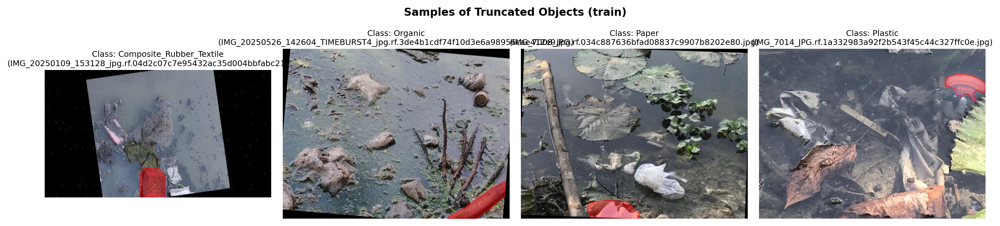


--- Occluded Samples ---
No occluded samples found in train.

--- Crowded Samples ---
No crowded samples found in train.


In [22]:
# ============================================================
# VISUALIZE TRUNCATED, OCCLUDED, AND CROWDED SAMPLES
# ============================================================
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def show_attribute_samples(dataset_path, attribute_type='truncated', max_samples_per_class=1):
    """Finds and displays examples of objects with specific attributes per class."""
    ann_file = os.path.join(dataset_path, "_annotations.coco.json")
    with open(ann_file, 'r') as f:
        data = json.load(f)
        
    categories = {cat['id']: cat['name'] for cat in data['categories']}
    images_info = {img['id']: img for img in data['images']}
    
    # Collect found samples by category
    samples = {cat_name: [] for cat_name in categories.values()}
    
    for ann in data['annotations']:
        cat_name = categories.get(ann['category_id'], 'Unknown')
        img_id = ann['image_id']
        img_info = images_info.get(img_id)
        if not img_info:
            continue
            
        has_attr = False
        if attribute_type == 'crowded':
            if ann.get('iscrowd', False):
                has_attr = True
        elif attribute_type == 'truncated':
            if 'bbox' in ann:
                img_w, img_h = img_info['width'], img_info['height']
                x, y, w, h = ann['bbox']
                if x < 0 or y < 0 or (x + w) > img_w or (y + h) > img_h:
                    has_attr = True
        elif attribute_type == 'occluded':
            if 'area' in ann and 'bbox' in ann:
                bbox_area = ann['bbox'][2] * ann['bbox'][3]
                visible_area = ann.get('area', bbox_area)
                if visible_area > 0 and (visible_area / bbox_area) < 0.7:
                    has_attr = True
                    
        if has_attr and len(samples[cat_name]) < max_samples_per_class:
            samples[cat_name].append((img_info['file_name'], ann))
            
    # Filter out categories that didn't find any match
    samples = {k: v for k, v in samples.items() if len(v) > 0}
    
    if not samples:
        print(f"No {attribute_type} samples found in {os.path.basename(dataset_path)}.")
        return
        
    num_classes = len(samples)
    fig, axes = plt.subplots(1, num_classes, figsize=(5 * num_classes, 5))
    if num_classes == 1:
        axes = [axes]
        
    fig.suptitle(f'Samples of {attribute_type.capitalize()} Objects ({os.path.basename(dataset_path)})', fontsize=16, fontweight='bold')
    
    for ax, (cat_name, items) in zip(axes, samples.items()):
        img_name, ann = items[0]
        img_path = os.path.join(dataset_path, img_name)
        
        try:
            img = Image.open(img_path)
            ax.imshow(img)
            
            # draw segmentation polygon if available
            if 'segmentation' in ann and ann['segmentation']:
                for seg in ann['segmentation']:
                    poly = np.array(seg).reshape((int(len(seg)/2), 2))
                    polygon = patches.Polygon(poly, closed=True, edgecolor='red', fill=True, facecolor='red', alpha=0.4, linewidth=2)
                    ax.add_patch(polygon)
            elif 'bbox' in ann:
                # fallback to bounding box
                x, y, w, h = ann['bbox']
                rect = patches.Rectangle((x, y), w, h, linewidth=3, edgecolor='red', facecolor='none')
                ax.add_patch(rect)
            
            ax.set_title(f"Class: {cat_name}\n({img_name})", fontsize=12)
            ax.axis('off')
        except Exception as e:
            ax.set_title(f"Image missing:\n{img_name}")
            ax.axis('off')
            
    plt.tight_layout()
    plt.show()

# Show samples for all three attributes using the Training directory
print("--- Truncated Samples ---")
show_attribute_samples(BALANCED_TRAIN_DIR, attribute_type='truncated')
print("\n--- Occluded Samples ---")
show_attribute_samples(BALANCED_TRAIN_DIR, attribute_type='occluded')
print("\n--- Crowded Samples ---")
show_attribute_samples(BALANCED_TRAIN_DIR, attribute_type='crowded')

Analyzing single-object vs multi-object composition...



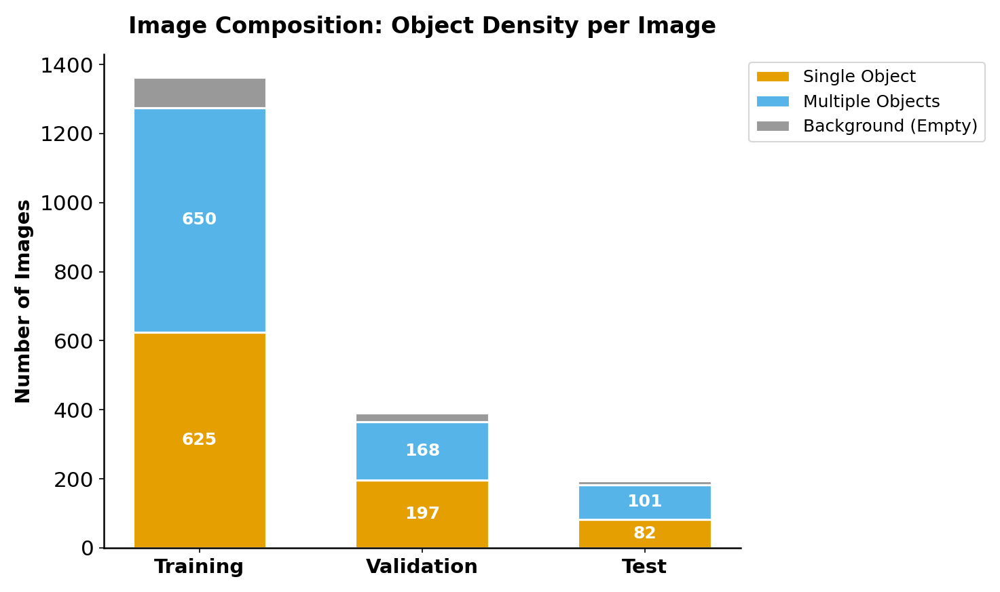

Training Set: 625 single-obj, 650 multi-obj images.
Validation Set: 197 single-obj, 168 multi-obj images.
Test Set: 82 single-obj, 101 multi-obj images.


In [19]:
# ============================================================
# 5. SINGLE-OBJECT VS MULTI-OBJECT IMAGES
# ============================================================
import json
import os
import matplotlib.pyplot as plt
import numpy as np

def analyze_object_complexity(dataset_paths, split_names):
    """Analyze images with a single object vs multi-object instances"""
    
    results = {}
    
    for split_name, dataset_path in zip(split_names, dataset_paths):
        ann_file = os.path.join(dataset_path, "_annotations.coco.json")
        try:
            with open(ann_file, 'r') as f:
                data = json.load(f)
        except (FileNotFoundError, IOError):
            continue
            
        img_counts = {img['id']: 0 for img in data['images']}
        for ann in data['annotations']:
            img_counts[ann['image_id']] += 1
            
        zero_obj = sum(1 for v in img_counts.values() if v == 0)
        single_obj = sum(1 for v in img_counts.values() if v == 1)
        multi_obj = sum(1 for v in img_counts.values() if v > 1)
        
        results[split_name] = {
            'Background (0 objs)': zero_obj,
            'Single Object (1 obj)': single_obj,
            'Multiple Objects (>1 obj)': multi_obj,
            'Total': len(img_counts)
        }
        
    return results

print("Analyzing single-object vs multi-object composition...\n")
complexity_stats = analyze_object_complexity(
    [BALANCED_TRAIN_DIR, BALANCED_VAL_DIR, BALANCED_TEST_DIR],
    ['Training', 'Validation', 'Test']
)

# Plot Single vs Multi Object
fig, ax = plt.subplots(figsize=(10, 6))

labels = list(complexity_stats.keys())
backgrounds = [complexity_stats[l]['Background (0 objs)'] for l in labels]
singles = [complexity_stats[l]['Single Object (1 obj)'] for l in labels]
multis = [complexity_stats[l]['Multiple Objects (>1 obj)'] for l in labels]

x = np.arange(len(labels))
width = 0.6

# Stacked bar plot
p1 = ax.bar(x, singles, width, label='Single Object', color=CB_PALETTE[0], edgecolor='white', linewidth=1.5)
p2 = ax.bar(x, multis, width, bottom=singles, label='Multiple Objects', color=CB_PALETTE[1], edgecolor='white', linewidth=1.5)
p3 = ax.bar(x, backgrounds, width, bottom=np.array(singles) + np.array(multis), 
            label='Background (Empty)', color='#999999', edgecolor='white', linewidth=1.5)

ax.set_ylabel('Number of Images', fontsize=14, fontweight='bold')
ax.set_title('Image Composition: Object Density per Image', fontsize=16, fontweight='bold', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=14, fontweight='bold')
ax.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1, 1))

# Labels on bars
for p in [p1, p2]:
    for rect in p:
        h = rect.get_height()
        if h > 0:
            ax.text(rect.get_x() + rect.get_width() / 2., rect.get_y() + h / 2.,
                    f'{int(h)}', ha='center', va='center', color='white', 
                    fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

for split, stats in complexity_stats.items():
    print(f"{split} Set: {stats['Single Object (1 obj)']} single-obj, {stats['Multiple Objects (>1 obj)']} multi-obj images.")

Generating Single vs Multiple Object Samples...


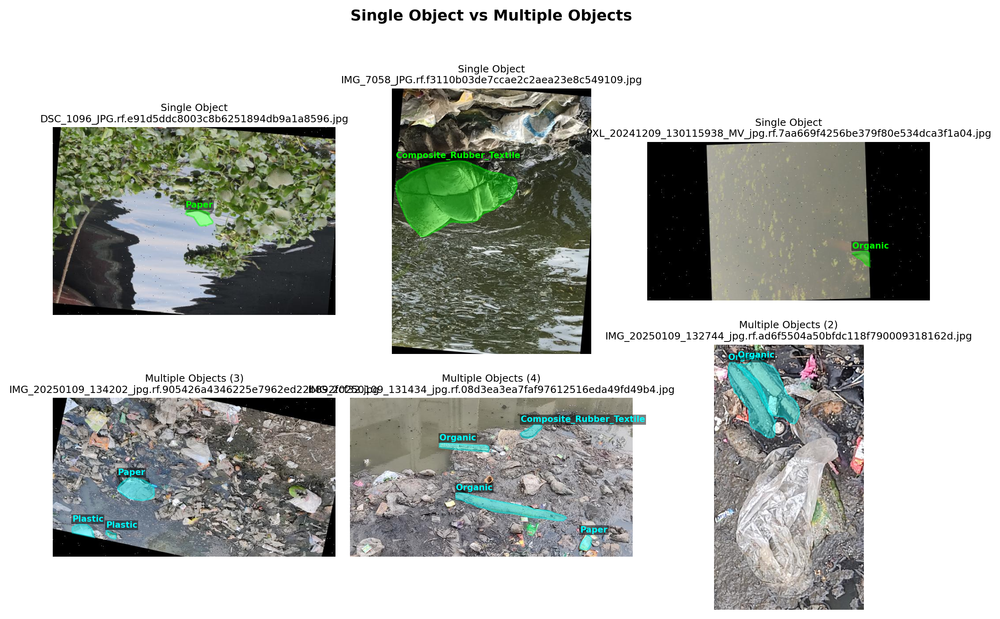

In [21]:
# ============================================================
# SHOW SAMPLES: SINGLE-OBJECT VS MULTI-OBJECT
# ============================================================
import random
import numpy as np
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def sample_complexity_images(dataset_path, num_samples=3):
    ann_file = os.path.join(dataset_path, "_annotations.coco.json")
    with open(ann_file, 'r') as f:
        data = json.load(f)
        
    img_by_id = {img['id']: img for img in data['images']}
    categories = {cat['id']: cat['name'] for cat in data['categories']}
    
    # Count annotations per image
    ann_by_img = defaultdict(list)
    for ann in data['annotations']:
        ann_by_img[ann['image_id']].append(ann)
        
    single_obj_imgs = []
    multi_obj_imgs = []
    
    for img_id, img_info in img_by_id.items():
        anns = ann_by_img[img_id]
        if len(anns) == 1:
            single_obj_imgs.append((img_info, anns))
        elif len(anns) > 1:
            multi_obj_imgs.append((img_info, anns))
            
    # Sample randomly
    sampled_single = random.sample(single_obj_imgs, min(num_samples, len(single_obj_imgs)))
    sampled_multi = random.sample(multi_obj_imgs, min(num_samples, len(multi_obj_imgs)))
    
    # Plotting
    fig, axes = plt.subplots(2, num_samples, figsize=(5 * num_samples, 10))
    fig.suptitle('Single Object vs Multiple Objects', fontsize=18, fontweight='bold', y=1.02)
    
    # Row 0: Single Object
    for i, (img_info, anns) in enumerate(sampled_single):
        ax = axes[0, i]
        img_path = os.path.join(dataset_path, img_info['file_name'])
        try:
            img = Image.open(img_path)
            ax.imshow(img)
            
            for ann in anns:
                cat_name = categories[ann['category_id']]
                if 'segmentation' in ann and ann['segmentation']:
                    for seg in ann['segmentation']:
                        poly = np.array(seg).reshape((int(len(seg)/2), 2))
                        polygon = patches.Polygon(poly, closed=True, edgecolor='lime', fill=True, facecolor='lime', alpha=0.4, linewidth=2)
                        ax.add_patch(polygon)
                        # Add text at the top-left of the first polygon
                        ax.text(np.min(poly[:, 0]), np.min(poly[:, 1]) - 5, cat_name, color='lime', fontsize=10, fontweight='bold', 
                                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=1))
                else:
                    x, y, w, h = ann['bbox']
                    rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='lime', facecolor='none')
                    ax.add_patch(rect)
                    ax.text(x, y - 5, cat_name, color='lime', fontsize=10, fontweight='bold', 
                            bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=1))
            
            ax.set_title(f"Single Object\n{img_info['file_name']}", fontsize=12)
            ax.axis('off')
        except Exception:
            ax.set_title(f"Missing Image\n{img_info['file_name']}")
            ax.axis('off')
            
    # Row 1: Multiple Objects
    for i, (img_info, anns) in enumerate(sampled_multi):
        ax = axes[1, i]
        img_path = os.path.join(dataset_path, img_info['file_name'])
        try:
            img = Image.open(img_path)
            ax.imshow(img)
            
            for ann in anns:
                cat_name = categories[ann['category_id']]
                if 'segmentation' in ann and ann['segmentation']:
                    for seg in ann['segmentation']:
                        poly = np.array(seg).reshape((int(len(seg)/2), 2))
                        polygon = patches.Polygon(poly, closed=True, edgecolor='cyan', fill=True, facecolor='cyan', alpha=0.4, linewidth=2)
                        ax.add_patch(polygon)
                        ax.text(np.min(poly[:, 0]), np.min(poly[:, 1]) - 5, cat_name, color='cyan', fontsize=10, fontweight='bold', 
                                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=1))
                else:
                    x, y, w, h = ann['bbox']
                    rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='cyan', facecolor='none')
                    ax.add_patch(rect)
                    ax.text(x, y - 5, cat_name, color='cyan', fontsize=10, fontweight='bold', 
                            bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=1))
            
            ax.set_title(f"Multiple Objects ({len(anns)})\n{img_info['file_name']}", fontsize=12)
            ax.axis('off')
        except Exception:
            ax.set_title(f"Missing Image\n{img_info['file_name']}")
            ax.axis('off')
            
    plt.tight_layout()
    plt.show()

# Show samples from the training set
print("Generating Single vs Multiple Object Samples...")
sample_complexity_images(BALANCED_TRAIN_DIR, num_samples=3)